# Advanced Machine Learning Final Project
East Section Group 3  
Natasha Malik, Gabby Salera, Eric Shin, Steven Villalon

December 2025

In [ ]:
# Load dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, recall_score, precision_score
from tensorflow.keras.datasets import cifar100
from sklearn.preprocessing import minmax_scale, StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Input, Dropout
from tensorflow.keras.callbacks import EarlyStopping


seed = 1842
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)


In [ ]:
# Load CIFAR-100 data
(x_train, y_train), (x_test, y_test) = cifar100.load_data(label_mode="fine")

# CIFAR-100 fine label names:
fine_labels = [
    'apple','aquarium_fish','baby','bear','beaver','bed','bee','beetle','bicycle','bottle',
    'bowl','boy','bridge','bus','butterfly','camel','can','castle','caterpillar','cattle',
    'chair','chimpanzee','clock','cloud','cockroach','couch','crab','crocodile','cup','dinosaur',
    'dolphin','elephant','flatfish','forest','fox','girl','hamster','house','kangaroo','keyboard',
    'lamp','lawn_mower','leopard','lion','lizard','lobster','man','maple_tree','motorcycle','mountain',
    'mouse','mushroom','oak_tree','orange','orchid','otter','palm_tree','pear','pickup_truck','pine_tree',
    'plain','plate','poppy','porcupine','possum','rabbit','raccoon','ray','road','rocket','rose',
    'sea','seal','shark','shrew','skunk','skyscraper','snail','snake','spider','squirrel','streetcar',
    'sunflower','sweet_pepper','table','tank','telephone','television','tiger','tractor','train',
    'trout','tulip','turtle','wardrobe','whale','willow_tree','wolf','woman','worm'
]


In [ ]:
# Check dimensions
print("Train:", x_train.shape, y_train.shape)
print("Test:", x_test.shape, y_test.shape)


Train: (50000, 32, 32, 3) (50000, 1)
Test: (10000, 32, 32, 3) (10000, 1)


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [195, 205, 193],
        [212, 224, 204],
        [182, 194, 167]],

       [[255, 255, 255],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [170, 176, 150],
        [161, 168, 130],
        [146, 154, 113]],

       [[255, 255, 255],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [189, 199, 169],
        [166, 178, 130],
        [121, 133,  87]],

       ...,

       [[148, 185,  79],
        [142, 182,  57],
        [140, 179,  60],
        ...,
        [ 30,  17,   1],
        [ 65,  62,  15],
        [ 76,  77,  20]],

       [[122, 157,  66],
        [120, 155,  58],
        [126, 160,  71],
        ...,
        [ 22,  16,   3],
        [ 97, 112,  56],
        [141, 161,  87]],

       [[ 87, 122,  41],
        [ 88, 122,  39],
        [101, 134,  56],
        ...,
        [ 34,  36,  10],
        [105, 133,  59],
        [138, 173,  79]]], dtype=uint8)
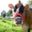

In [ ]:
# View example
x_train[0]
#x_train[0][0]
#x_train[0][0][0]

Each image is a 32x32x3 tensor. This means there are 1024 ($32^2$) pixels per image, and there are 3 layers (red, green, blue), so there are 3072 numbers that make up each image.

# View Images

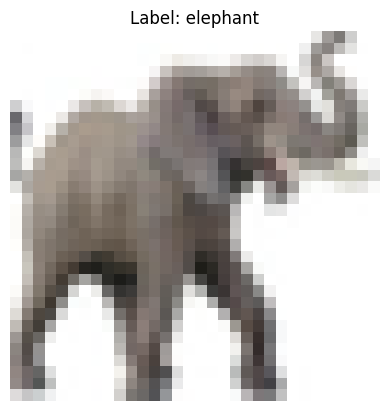

In [ ]:
# Sample image
my_img = 9
img = x_train[my_img]
label_index = y_train[my_img][0]
label_name = fine_labels[label_index]

# Plot image
plt.imshow(img, interpolation='nearest')
plt.title(f"Label: {label_name}")
plt.axis('off')
plt.show()


In [ ]:
# Animal groups we are interested in (large carnivores, omnivores, & reptiles)
animals = [
    'crocodile', 'dinosaur', 'lizard', 'snake', 'turtle',
    'bear', 'leopard', 'lion', 'tiger', 'wolf',
    'camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo'
]


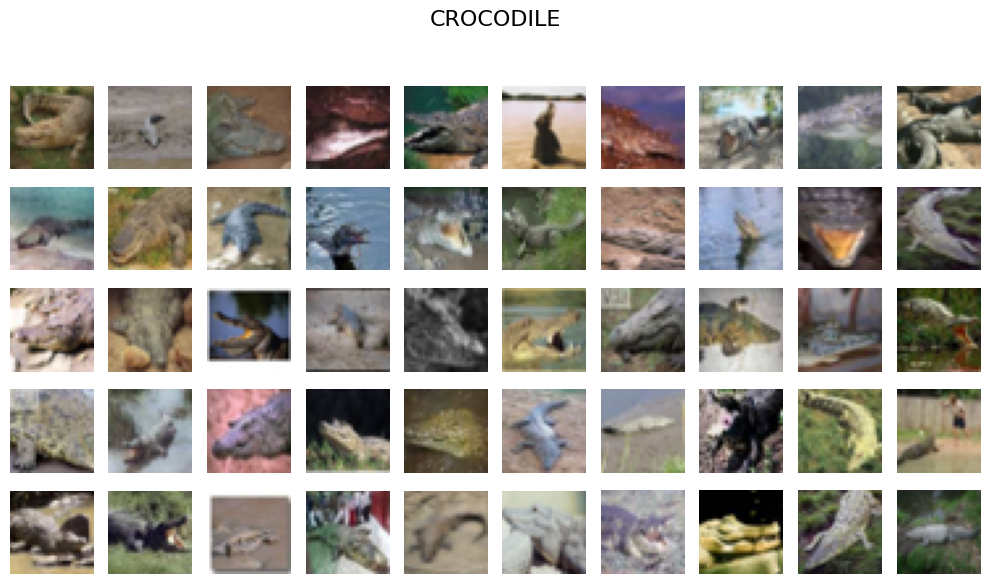

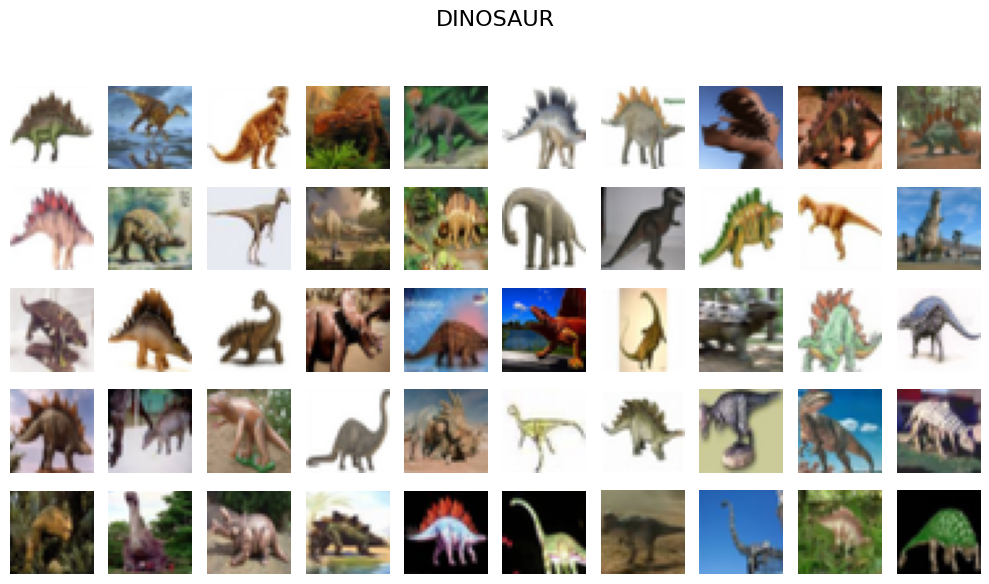

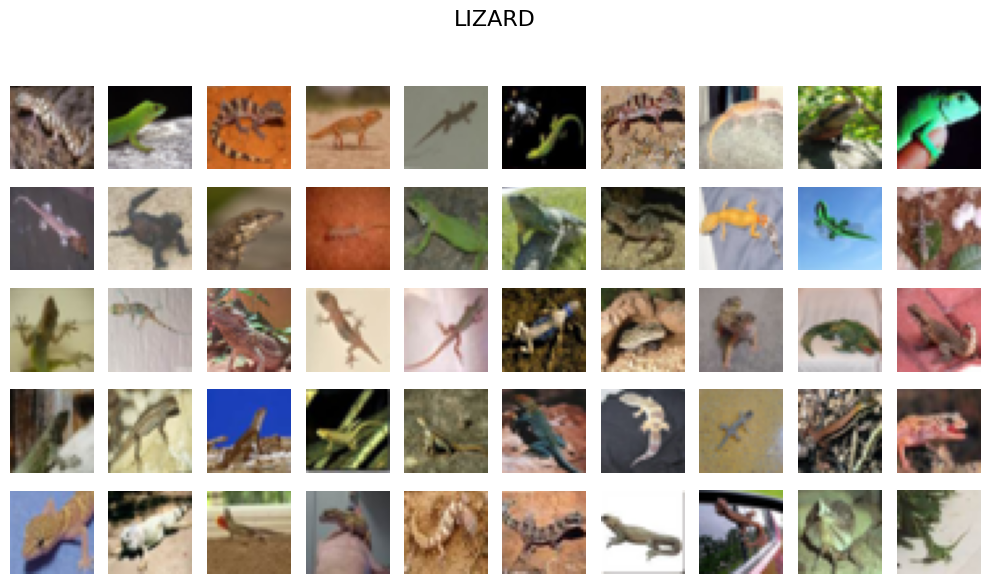

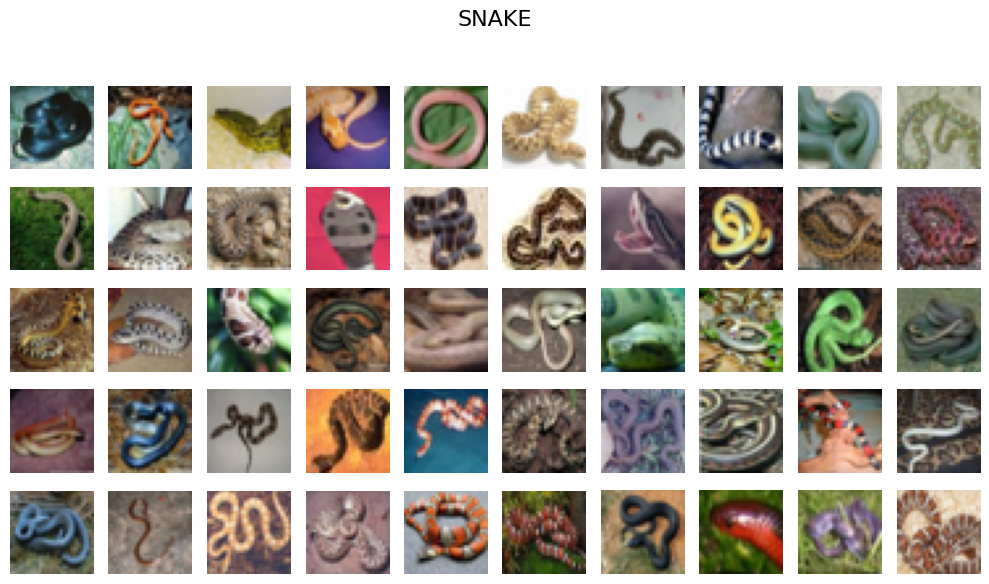

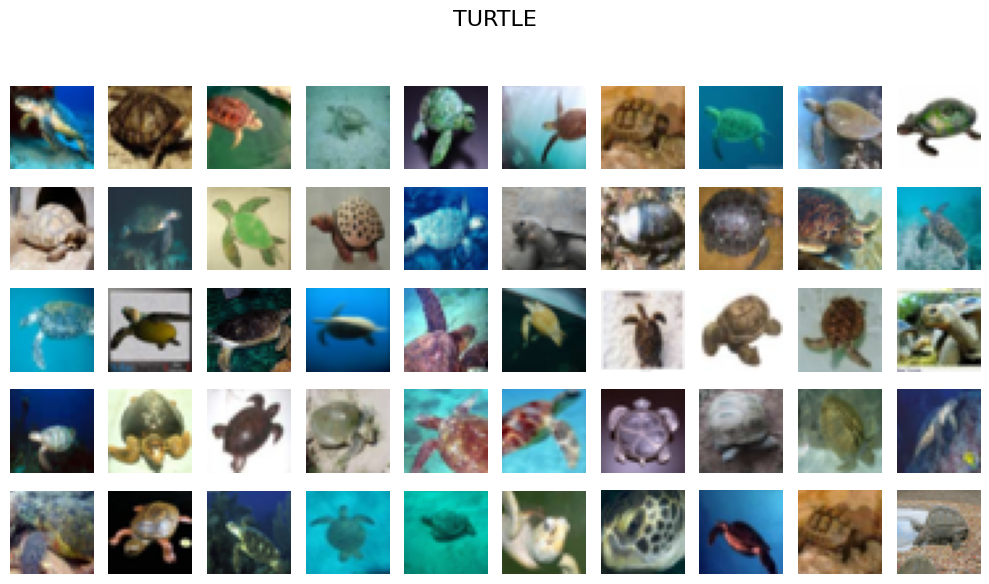

...

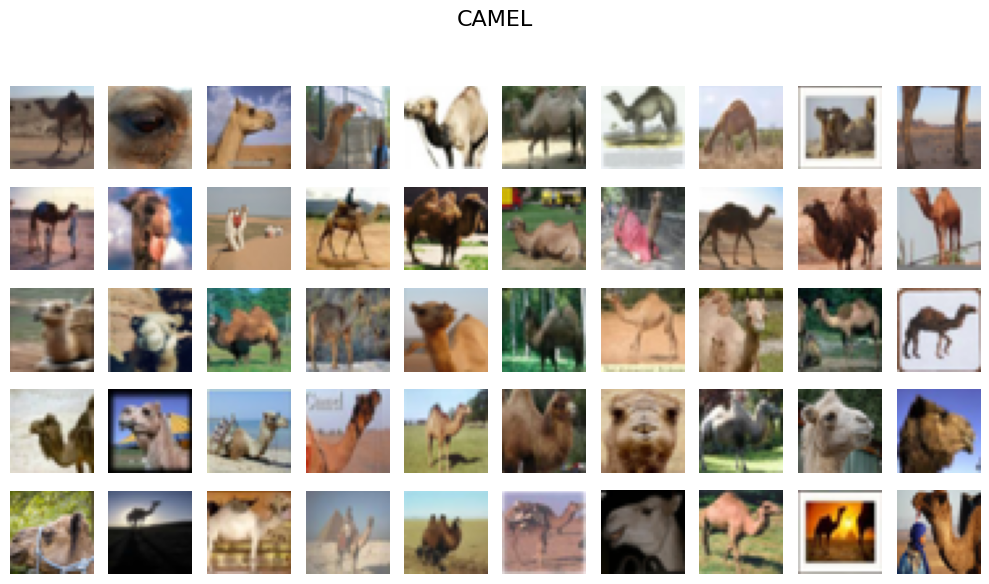

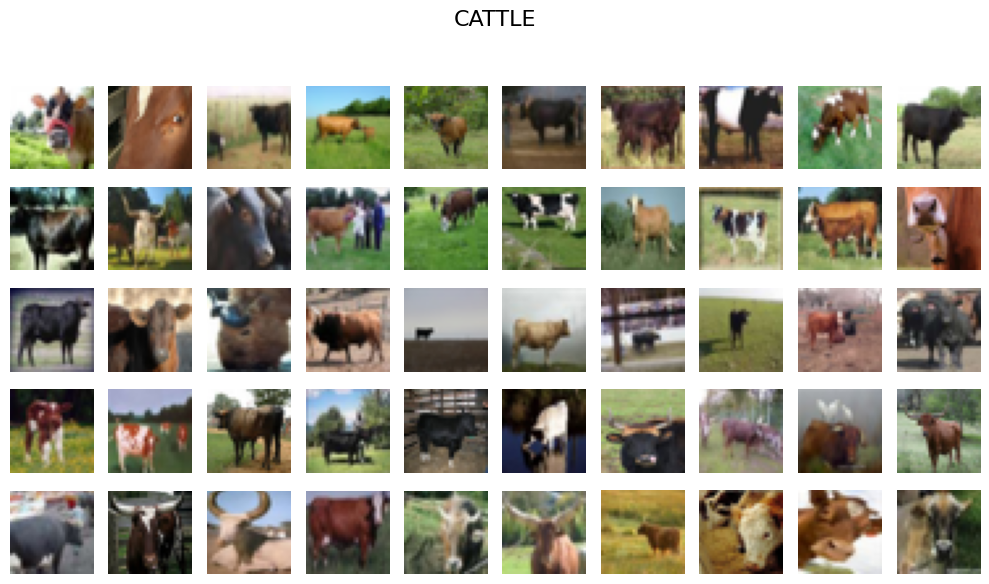

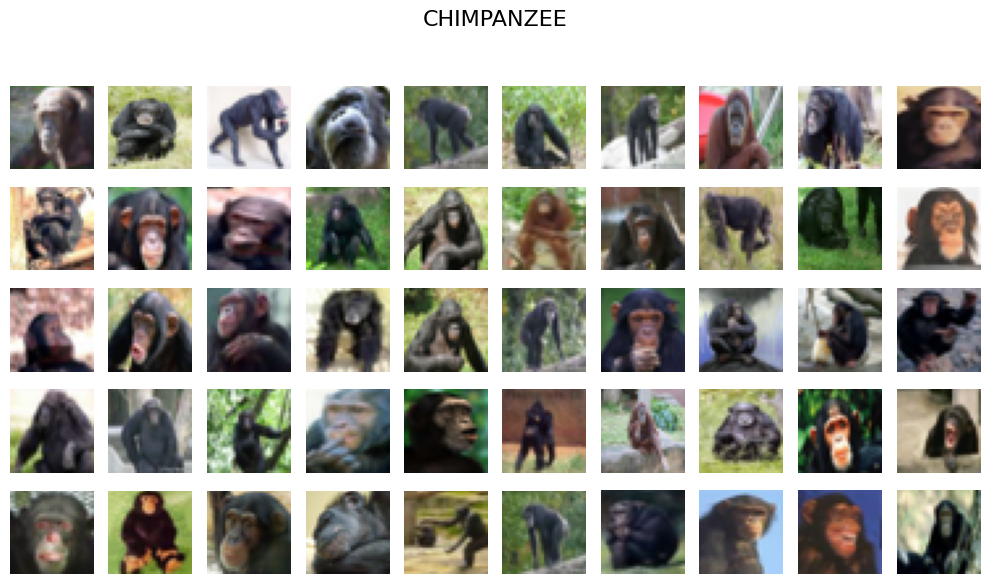

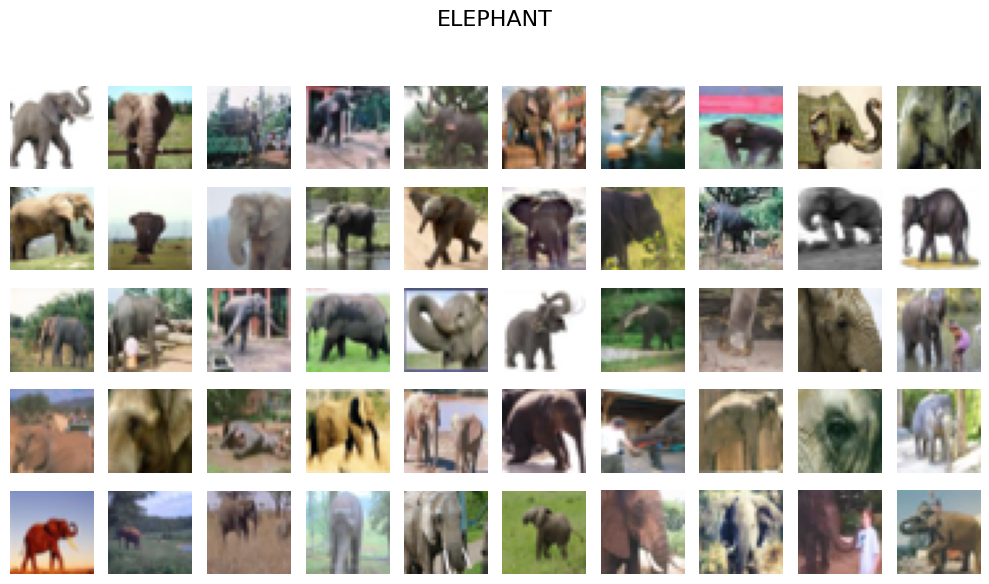

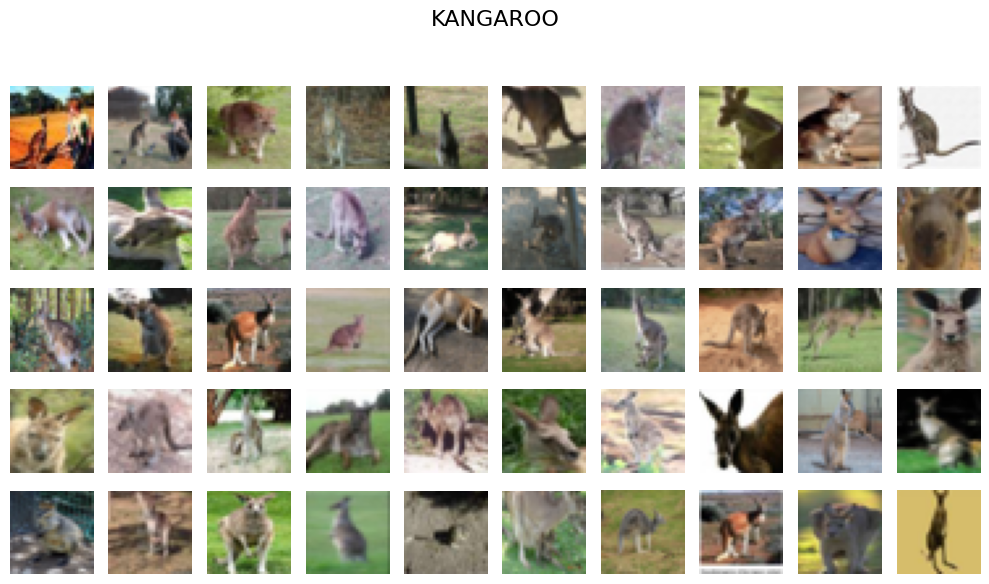

In [ ]:
# Loop through dataset and print example images of each subgroup
for animal in animals:
    # Get label index
    label_idx = fine_labels.index(animal)

    # Filter to only this class
    mask = (y_train.flatten() == label_idx)
    imgs = x_train[mask]

    # Plot 50 images
    fig, axes = plt.subplots(5, 10, figsize=(10, 6))
    for ax, img in zip(axes.flat, imgs[:50]):
        ax.imshow(img)
        ax.axis("off")

    fig.suptitle(animal.upper(), fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


## Create train and test sets

In [ ]:
# Define groups of interest
reptiles = ['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle']
carnivores = ['bear', 'leopard', 'lion', 'tiger', 'wolf']
omnivores = ['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo']

In [ ]:
# Get the ids for the groups of interest
def labels_to_indices(names, fine_labels):
    return [fine_labels.index(name) for name in names]

reptiles_idx = labels_to_indices(reptiles, fine_labels)
carnivores_idx = labels_to_indices(carnivores, fine_labels)
omnivores_idx = labels_to_indices(omnivores, fine_labels)

print("Reptiles:", reptiles_idx)
print("Carnivores:", carnivores_idx)
print("Omnivores:", omnivores_idx)


Reptiles: [27, 29, 44, 78, 93]
Carnivores: [3, 42, 43, 88, 97]
Omnivores: [15, 19, 21, 31, 38]


In [ ]:
# Get the indexes where all the groups of interest appear to create a filter
idx_of_interest = set(reptiles_idx + carnivores_idx + omnivores_idx)

y_train_flat = y_train.flatten()
train_mask = np.isin(y_train_flat, list(idx_of_interest))

# Use the filter to limit test/train sets to just the groups of interest
X_train_sub = x_train[train_mask]
y_train_sub = y_train[train_mask]


In [ ]:
# Do the same to the test set
y_test_flat = y_test.flatten()
test_mask = np.isin(y_test_flat, list(idx_of_interest))

X_test_sub = x_test[test_mask]
y_test_sub = y_test[test_mask]


In [ ]:
# Make y_train_sub and y_test_sub binary where reptiles = 1 else = 0
y_train_sub_flat = y_train_sub.flatten()
y_train_sub_binary = np.array([1 if label in reptiles_idx else 0 for label in y_train_sub_flat])

y_test_sub_flat = y_test_sub.flatten()
y_test_sub_binary = np.array([1 if label in reptiles_idx else 0 for label in y_test_sub_flat])


In [ ]:
# Create validation set
X_train_clean, X_valid_clean, y_train_clean, y_valid_clean = train_test_split(X_train_sub, y_train_sub_binary, test_size=0.2, stratify=y_train_sub_binary, random_state=seed)

# Clean test set names
X_test_clean = X_test_sub.copy()
y_test_clean = y_test_sub_binary.copy()


In [ ]:
# Check final dimensions
print(X_train_clean.shape)
print(y_train_clean.shape)
print(X_valid_clean.shape)
print(y_valid_clean.shape)
print(X_test_clean.shape)
print(y_test_clean.shape)


(6000, 32, 32, 3)
(6000,)
(1500, 32, 32, 3)
(1500,)
(1500, 32, 32, 3)
(1500,)


Now that we've set up our data including a binary classification column, we can proceed to examine the separate classes (mammals & reptiles) further, as well as conduct an additional examination into dinosaurs vs non dinosaurs to see if there are any notable differences in the two.

# EDA

We consider two related binary problems:  
  EDA-A: Large mammals (carnivores + omnivores) vs reptiles  
  EDA-B: Dinosaur vs non-dinosaur

##EDA-A: Large Mammals (Carnivores + Omnivores) vs Reptiles

In [ ]:
# Split train set into mammals vs reptiles using existing binary labels
X_train_mammals = X_train_clean[y_train_clean == 0]
X_train_reptiles = X_train_clean[y_train_clean == 1]

X_test_mammals = X_test_clean[y_test_clean == 0]
X_test_reptiles = X_test_clean[y_test_clean == 1]

print("EDA-A X_train_mammals:", X_train_mammals.shape)
print("EDA-A X_train_reptiles:", X_train_reptiles.shape)
print("EDA-A X_test_mammals:", X_test_mammals.shape)
print("EDA-A X_test_reptiles:", X_test_reptiles.shape)

EDA-A X_train_mammals: (4000, 32, 32, 3)
EDA-A X_train_reptiles: (2000, 32, 32, 3)
EDA-A X_test_mammals: (1000, 32, 32, 3)
EDA-A X_test_reptiles: (500, 32, 32, 3)


In [ ]:
# Train-set RGB stats
mean_mammals = X_train_mammals.mean(axis=(0, 1, 2))
std_mammals  = X_train_mammals.std(axis=(0, 1, 2))

mean_reptiles = X_train_reptiles.mean(axis=(0, 1, 2))
std_reptiles  = X_train_reptiles.std(axis=(0, 1, 2))

print("Large Mammals RGB mean/std:", mean_mammals, std_mammals)
print("Reptiles RGB mean/std:", mean_reptiles, std_reptiles)

Large Mammals RGB mean/std: [121.72787769 115.27976245  98.32485303] [60.78880258 58.84807738 59.24696483]
Reptiles RGB mean/std: [123.96238525 121.28884961 110.121625  ] [66.89202401 61.73093912 64.44209527]


It looks like the reptile data set has a higher average saturation across all colors, as well as a higher variation between images vs the mammalian data set. All of the color values are higher on average for reptiles. Additionally, we can infer that the reptile data set tends to be cooler on average given the significantly higher mean blue value vs the mammalian data set (110 vs 98). The increased saturation and variability is self evident in the example pictures above, but this confirms it with data.

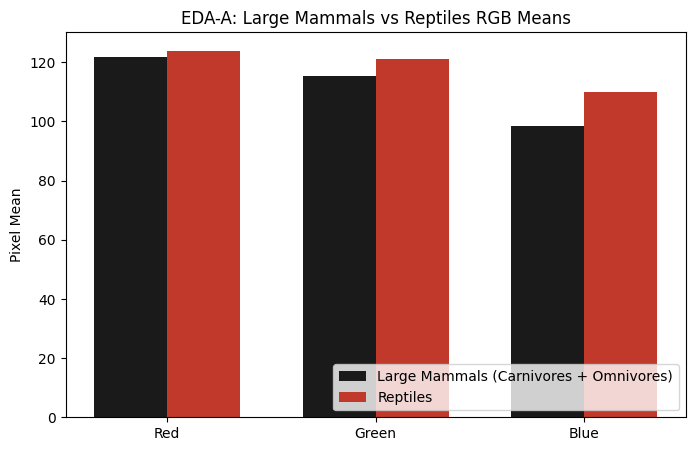

In [ ]:
# Bar plot: RGB means
rgb_labels = ["Red", "Green", "Blue"]
x = np.arange(3)
width = 0.35

plt.figure(figsize=(8, 5))
plt.bar(x - width/2, mean_mammals, width, label='Large Mammals (Carnivores + Omnivores)', color='#1a1a1a')
plt.bar(x + width/2, mean_reptiles, width, label='Reptiles', color="#c0392b")
plt.xticks(x, rgb_labels)
plt.ylabel("Pixel Mean")
plt.title("EDA-A: Large Mammals vs Reptiles RGB Means")
plt.legend(loc='lower right')
plt.show()

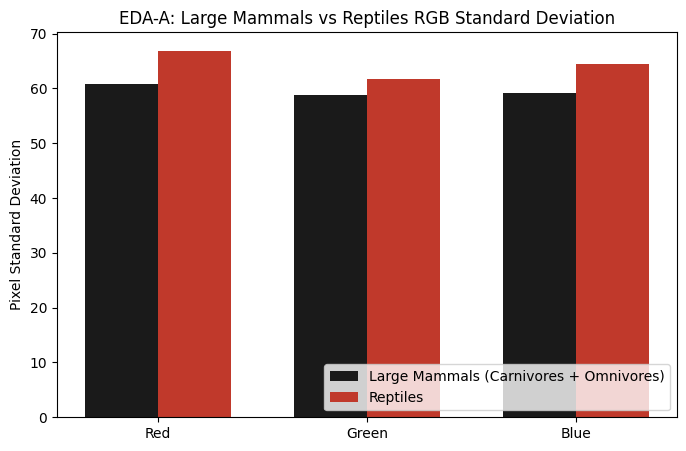

In [ ]:
# Bar plot: RGB standard deviations
plt.figure(figsize=(8, 5))
plt.bar(x - width/2, std_mammals, width, label='Large Mammals (Carnivores + Omnivores)', color='#1a1a1a')
plt.bar(x + width/2, std_reptiles, width, label='Reptiles', color='#c0392b')
plt.xticks(x, rgb_labels)
plt.ylabel("Pixel Standard Deviation")
plt.title("EDA-A: Large Mammals vs Reptiles RGB Standard Deviation")
plt.legend(loc='lower right')
plt.show()

Shape/Body Mask: Large Mammals vs Reptiles

In [ ]:
def get_foreground_mask(img, min_size=20):
    """
    Create a foreground mask to isolate the animal from the background.
    Uses Otsu thresholding on grayscale.
    """
    gray = rgb2gray(img)
    t = threshold_otsu(gray)
    mask = gray < t      # heuristic: darker foreground
    mask = remove_small_objects(mask, min_size=min_size)
    return mask

def average_mask(X):
    """
    Compute the average foreground mask over a stack of images X.
    """
    acc = np.zeros(X.shape[1:3], dtype=np.float32)
    for img in X:
        m = get_foreground_mask(img)
        acc += m.astype(np.float32)
    return acc / len(X)

avg_mask_mammals = average_mask(X_train_mammals)
avg_mask_reptiles = average_mask(X_train_reptiles)


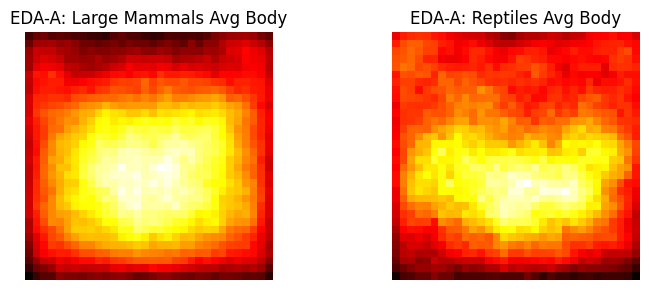

In [ ]:
plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.imshow(avg_mask_mammals, cmap='hot')
plt.title("EDA-A: Large Mammals Avg Body")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(avg_mask_reptiles, cmap='hot')
plt.title("EDA-A: Reptiles Avg Body")
plt.axis("off")

plt.tight_layout()
plt.show()

This heatmap shows that the large mammals tend to have a higher center of gravity vs reptiles. This can be explained by the typical body shape of e.g. a lizard or a crocodile vs a cow or a bear. On average, the reptiles tend to have more variability in body positioning/shape, which is confirmed in this heatmap.

##EDA-B: Dinosaur vs Non-Dinosaur

Here we'll go one step further to see if sufficient differences exist between the dinosaurs & non dinosaurs to be able to conduct separate identification modeling. We will run all of the same analyses that we performed on the mammal vs reptile classes.

In [ ]:
dino_idx = fine_labels.index('dinosaur')
print("Dinosaur index:", dino_idx)

# Masks within the subset (X_train_sub / X_test_sub)
train_mask_dino = (y_train_sub_flat == dino_idx)
train_mask_non_dino = (y_train_sub_flat != dino_idx)

test_mask_dino = (y_test_sub_flat == dino_idx)
test_mask_non_dino = (y_test_sub_flat != dino_idx)

# Subsets
X_train_dino = X_train_sub[train_mask_dino]
X_train_non_dino = X_train_sub[train_mask_non_dino]

X_test_dino = X_test_sub[test_mask_dino]
X_test_non_dino = X_test_sub[test_mask_non_dino]

print("EDA-B X_train_dino:", X_train_dino.shape)
print("EDA-B X_train_non_dino:", X_train_non_dino.shape)


Dinosaur index: 29
EDA-B X_train_dino: (500, 32, 32, 3)
EDA-B X_train_non_dino: (7000, 32, 32, 3)


In [ ]:
# Binary labels: dinosaur = 1, non-dino = 0
y_train_dino = np.ones(len(X_train_dino), dtype=int)
y_train_non_dino = np.zeros(len(X_train_non_dino), dtype=int)

y_test_dino = np.ones(len(X_test_dino), dtype=int)
y_test_non_dino = np.zeros(len(X_test_non_dino), dtype=int)

RGB Statistics: Dinosaur vs Non-Dinosaur

In [ ]:
mean_non_dino = X_train_non_dino.mean(axis=(0, 1, 2))
std_non_dino  = X_train_non_dino.std(axis=(0, 1, 2))

mean_dino = X_train_dino.mean(axis=(0, 1, 2))
std_dino  = X_train_dino.std(axis=(0, 1, 2))

print("Non-Dinos RGB mean/std:", mean_non_dino, std_non_dino)
print("Dinos RGB mean/std:", mean_dino, std_dino)

Non-Dinos RGB mean/std: [121.00883538 116.00218876 100.74669127] [61.49734694 58.21530541 59.23192426]
Dinos RGB mean/std: [145.53694727 138.68357031 125.36114844] [77.40895578 77.76697705 82.76415583]


The dinosaur dataset appears to have even more saturation & variability as a class vs all other non dinosaur images. The gap is >20 in every color, and the variability is >10. This makes sense because the dinosaur image set is all illustration vs majority camera images for the remainder of the data set, so the colors are the brightest with the greatest variability.

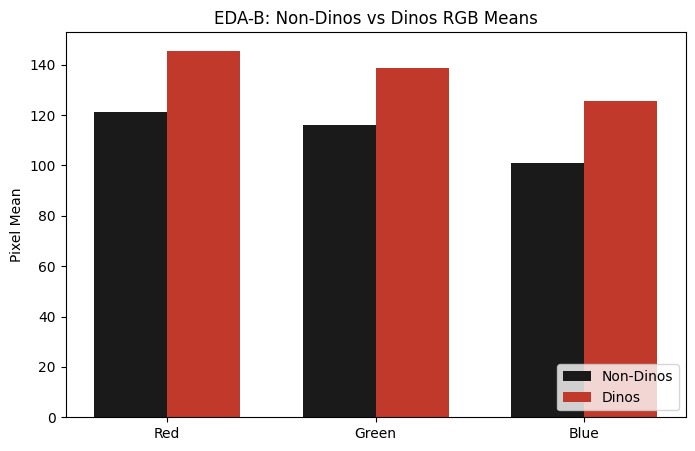

In [ ]:
plt.figure(figsize=(8, 5))
plt.bar(x - width/2, mean_non_dino, width, label='Non-Dinos', color='#1a1a1a')
plt.bar(x + width/2, mean_dino, width, label='Dinos', color='#c0392b')
plt.xticks(x, rgb_labels)
plt.ylabel("Pixel Mean")
plt.title("EDA-B: Non-Dinos vs Dinos RGB Means")
plt.legend(loc='lower right')
plt.show()

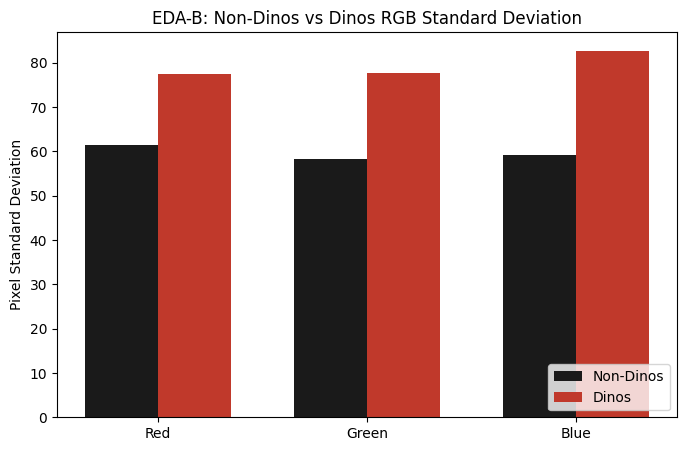

In [ ]:
plt.figure(figsize=(8, 5))
plt.bar(x - width/2, std_non_dino, width, label='Non-Dinos', color='#1a1a1a')
plt.bar(x + width/2, std_dino, width, label='Dinos', color='#c0392b')
plt.xticks(x, rgb_labels)
plt.ylabel("Pixel Standard Deviation")
plt.title("EDA-B: Non-Dinos vs Dinos RGB Standard Deviation")
plt.legend(loc='lower right')
plt.show()

Shape / Body Mask: Dinosaur vs Non-Dinosaur

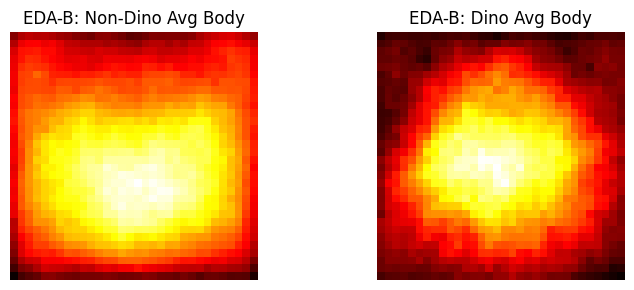

In [ ]:
avg_mask_non_dino = average_mask(X_train_non_dino)
avg_mask_dino = average_mask(X_train_dino)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.imshow(avg_mask_non_dino, cmap='hot')
plt.title("EDA-B: Non-Dino Avg Body")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(avg_mask_dino, cmap='hot')
plt.title("EDA-B: Dino Avg Body")
plt.axis("off")

plt.tight_layout()
plt.show()

The heatmap also shows significant difference between the dinosaur dataset vs the non-dinosaur dataset. It appears as though the dinosaurs typically occupy the center of the frame and/or have a higher center of gravity vs the non-dinosaur dataset, probably because the dinosaur dataset is exclusively made up of illustrations which tend to center the subject of interest.

**Conclusion: The results of our EDA indicate that there is ample difference between the classes to build not only a mammal vs reptile image classification model, but also a model that differentiates between dinosaurs & non-dinosaurs.**

# Modeling

##Logistic Regression

This is our baseline model for differentiating between reptiles & mammals against which we will try to measure future model performance

In [ ]:
#Defining the shape of X_train (n_samples, h, w, c)
n_samples, h, w, c = X_train_clean.shape

#Reshaping the training, test, and validation sets to 2 dimensions
X_train_lr = X_train_clean.reshape(n_samples, -1)

X_test_lr = X_test_clean.reshape(X_test_clean.shape[0], -1)

X_valid_lr = X_valid_clean.reshape(X_valid_clean.shape[0], -1)

#Standardizing the training data so that each column has mean 0 and standard deviation 1
scaler = StandardScaler()

X_train_lr = scaler.fit_transform(X_train_lr)

#Applying the transformations to the test and validation sets
X_test_lr = scaler.transform(X_test_lr)

X_valid_lr = scaler.transform(X_valid_lr)

In [ ]:
#Computing PCA on the training set using 300 components
pca = PCA(n_components = 300, random_state = 1).fit(X_train_lr)

#Scaling the values of each image to fall within range 0 to 1
loadings = minmax_scale(pca.components_, feature_range = (0, 1), axis = 1)

In [ ]:
#Using PCA to transform the training, test, and validation sets to their principal components
X_train_lr_pca = pca.transform(X_train_lr)

X_test_lr_pca = pca.transform(X_test_lr)

X_valid_lr_pca = pca.transform(X_valid_lr)

In [ ]:
#Reshaping the target arrays to 1 dimension
y_train_lr_1d = y_train_clean.ravel()

y_test_lr_1d = y_test_clean.ravel()

y_valid_lr_1d = y_valid_clean.ravel()

Running the Logistic Regression Base Model

In [ ]:
#Training a logistic regression model on these principal components while using cross validation
lr = LogisticRegressionCV(Cs = [.1, 1, 10],
                          cv = 5,
                          penalty = 'l1',
                          solver = 'liblinear',
                          max_iter = 2000,
                          random_state = seed)

lr.fit(X_train_lr_pca, y_train_lr_1d)

#Making predictions on the validation set
y_prob_lr = lr.predict_proba(X_valid_lr_pca)[:, 1]

y_pred_lr = (y_prob_lr > 0.4).astype(int)

#Evaluating the model on the validation set and printing the classification report consisting of accuracy, precision, recall, and f1-score
print(confusion_matrix(y_valid_lr_1d, y_pred_lr))

print(classification_report(y_valid_lr_1d, y_pred_lr, digits = 4))

[[758 242]
 [261 239]]
              precision    recall  f1-score   support

           0     0.7439    0.7580    0.7509      1000
           1     0.4969    0.4780    0.4873       500

    accuracy                         0.6647      1500
   macro avg     0.6204    0.6180    0.6191      1500
weighted avg     0.6615    0.6647    0.6630      1500



Our logistic regression base model has a poor performance, especially when accurately classifying reptiles. The accuracy of .66 is what would be expected if every item in the dataset is labeled as a mammal by default. Even lowering the threshold to 40% to account for the data imbalance does not boost the accuracy for reptiles.

## CNNs

### Model 1

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model1 = Sequential()
model1.add(Input((32,32,3)))
model1.add(Conv2D(16, kernel_size=3, activation='relu',
                 padding='same'))
model1.add(MaxPooling2D(pool_size=(2, 2), strides=2))
model1.add(Flatten())
model1.add(Dense(1, activation='sigmoid'))

model1.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         4,097 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,545 (17.75 KB)

 Trainable params: 4,545 (17.75 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
model1.compile(optimizer='adam',
               loss='binary_crossentropy',
               metrics=['accuracy'])
model1.fit(X_train_clean, y_train_clean, epochs=10, batch_size=256,
           validation_data=(X_valid_clean, y_valid_clean))
model1.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - accuracy: 0.5359 - loss: 30.9127 - val_accuracy: 0.5107 - val_loss: 7.7812
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - accuracy: 0.5814 - loss: 7.2366 - val_accuracy: 0.5933 - val_loss: 5.5455
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.5929 - loss: 4.9698 - val_accuracy: 0.5800 - val_loss: 4.1796
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.6230 - loss: 3.7235 - val_accuracy: 0.6447 - val_loss: 3.2585
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - accuracy: 0.6585 - loss: 2.8881 - val_accuracy: 0.6627 - val_loss: 2.6187
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.6769 - loss: 2.3029 - val_accuracy: 0.6740 - val_loss: 2.3613
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.6895 - loss: 2.0767 - val_accuracy: 0.6760 - val_loss: 2.1328
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - accuracy: 0.6999 - loss: 1.8280 - val_accuracy: 0

[1.9048503637313843, 0.7053333520889282]

In [ ]:
y_prob1 = model1.predict(X_valid_clean)
y_pred1 = (y_prob1 > 0.5).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred1))
print(classification_report(y_valid_clean, y_pred1, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
[[834 166]
 [276 224]]
              precision    recall  f1-score   support

           0     0.7514    0.8340    0.7905      1000
           1     0.5744    0.4480    0.5034       500

    accuracy                         0.7053      1500
   macro avg     0.6629    0.6410    0.6469      1500
weighted avg     0.6924    0.7053    0.6948      1500



This model only had one layer. It's not much of an improvement over the base model, although there are incremental gains in accuracy.

### Model 2

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model2 = Sequential()
model2.add(Input((32, 32, 3)))

model2.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Flatten())
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(1, activation='sigmoid'))

model2.summary()


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,649 (1.36 MB)

 Trainable params: 355,649 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
model2.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# decreased batch size & increased epochs
model2.fit(
    X_train_clean, y_train_clean,
    epochs=15,
    batch_size=128,
    validation_data=(X_valid_clean, y_valid_clean)
)

model2.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 14s 266ms/step - accuracy: 0.5806 - loss: 17.4964 - val_accuracy: 0.6793 - val_loss: 0.6019
Epoch 2/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 275ms/step - accuracy: 0.6794 - loss: 0.6118 - val_accuracy: 0.6953 - val_loss: 0.5699
Epoch 3/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 20s 271ms/step - accuracy: 0.6932 - loss: 0.5821 - val_accuracy: 0.7187 - val_loss: 0.5496
Epoch 4/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 272ms/step - accuracy: 0.7090 - loss: 0.5619 - val_accuracy: 0.7327 - val_loss: 0.5265
Epoch 5/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 21s 275ms/step - accuracy: 0.7272 - loss: 0.5349 - val_accuracy: 0.7660 - val_loss: 0.5024
Epoch 6/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 273ms/step - accuracy: 0.7422 - loss: 0.5108 - val_accuracy: 0.7773 - val_loss: 0.4877
Epoch 7/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 13s 272ms/step - accuracy: 0.7608 - loss: 0.4903 - val_accuracy: 0.7787 - val_loss: 0.4816
Epoch 8/15
47/47 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - accuracy: 0.7671 - loss: 0.4742 - val_acc

[0.47701847553253174, 0.8013333082199097]

In [ ]:
# Summary stats
y_prob2 = model2.predict(X_valid_clean)
y_pred2 = (y_prob2 > 0.5).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred2))
print(classification_report(y_valid_clean, y_pred2, digits=4))


47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
[[943  57]
 [241 259]]
              precision    recall  f1-score   support

           0     0.7965    0.9430    0.8636      1000
           1     0.8196    0.5180    0.6348       500

    accuracy                         0.8013      1500
   macro avg     0.8080    0.7305    0.7492      1500
weighted avg     0.8042    0.8013    0.7873      1500



This model now adds several convolutional layers. I also decreased the batch size and increased epochs.

Model performed much better but recall for reptiles is bad. Need to improve on this.

### Model 3

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model3 = Sequential()
model3.add(Input((32, 32, 3)))

model3.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))

model3.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))

model3.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))

model3.add(Flatten())
model3.add(Dense(128, activation='relu'))
model3.add(Dropout(0.5))
model3.add(Dense(1, activation='sigmoid'))

model3.summary()


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,649 (1.36 MB)

 Trainable params: 355,649 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluat
# added class weight to make reptiles more important

class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model3.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

#decreased batch size & increased epochs
model3.fit(
    X_train_clean, y_train_clean,
    epochs=25,
    batch_size=64,
    validation_data=(X_valid_clean, y_valid_clean),
    class_weight=class_weight
)

model3.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - accuracy: 0.5169 - loss: 16.1152 - val_accuracy: 0.6880 - val_loss: 0.6209
Epoch 2/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - accuracy: 0.6090 - loss: 0.8672 - val_accuracy: 0.7353 - val_loss: 0.5692
Epoch 3/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 137ms/step - accuracy: 0.6301 - loss: 0.8347 - val_accuracy: 0.7473 - val_loss: 0.5104
Epoch 4/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 138ms/step - accuracy: 0.6531 - loss: 0.8014 - val_accuracy: 0.7340 - val_loss: 0.5426
Epoch 5/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - accuracy: 0.6814 - loss: 0.7803 - val_accuracy: 0.7707 - val_loss: 0.5004
Epoch 6/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - accuracy: 0.7138 - loss: 0.7214 - val_accuracy: 0.7700 - val_loss: 0.4909
Epoch 7/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 138ms/step - accuracy: 0.7195 - loss: 0.7260 - val_accuracy: 0.7913 - val_loss: 0.4709
Epoch 8/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - accuracy: 0.7372 - loss: 0.6962 - val_acc

[0.6789500713348389, 0.800000011920929]

In [ ]:
# Summary stats
y_prob3 = model3.predict(X_valid_clean)

# lowering threshold for reptiles
y_pred3 = (y_prob3 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred3))
print(classification_report(y_valid_clean, y_pred3, digits=4))


47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
[[869 131]
 [168 332]]
              precision    recall  f1-score   support

           0     0.8380    0.8690    0.8532      1000
           1     0.7171    0.6640    0.6895       500

    accuracy                         0.8007      1500
   macro avg     0.7775    0.7665    0.7714      1500
weighted avg     0.7977    0.8007    0.7986      1500



Recall improved a lot for reptiles, particularly by lowering the threshold from probability 0.5 to 0.4. Accuracy went down slightly

### Model 4

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model4 = Sequential()
model4.add(Input((32, 32, 3)))

model4.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model4.add(MaxPooling2D(pool_size=(2, 2)))

model4.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model4.add(MaxPooling2D(pool_size=(2, 2)))

model4.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model4.add(MaxPooling2D(pool_size=(2, 2)))

model4.add(Flatten())
model4.add(Dense(128, activation='relu'))
model4.add(Dropout(0.5))
model4.add(Dense(1, activation='sigmoid'))

model4.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,649 (1.36 MB)

 Trainable params: 355,649 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

# adding in recall & precision to the metrics
model4.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

model4.fit(
    X_train_clean, y_train_clean,
    epochs=25,
    batch_size=64,
    validation_data=(X_valid_clean, y_valid_clean),
    class_weight=class_weight
)

model4.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - accuracy: 0.5169 - loss: 16.1152 - precision: 0.3580 - recall: 0.5511 - val_accuracy: 0.6880 - val_loss: 0.6209 - val_precision: 0.5430 - val_recall: 0.4040
Epoch 2/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 138ms/step - accuracy: 0.6090 - loss: 0.8672 - precision: 0.4425 - recall: 0.6250 - val_accuracy: 0.7353 - val_loss: 0.5692 - val_precision: 0.6519 - val_recall: 0.4420
Epoch 3/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 138ms/step - accuracy: 0.6301 - loss: 0.8347 - precision: 0.4624 - recall: 0.6003 - val_accuracy: 0.7473 - val_loss: 0.5104 - val_precision: 0.6366 - val_recall: 0.5640
Epoch 4/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - accuracy: 0.6531 - loss: 0.8014 - precision: 0.4907 - recall: 0.6800 - val_accuracy: 0.7340 - val_loss: 0.5426 - val_precision: 0.5878 - val_recall: 0.6760
Epoch 5/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - accuracy: 0.6814 - loss: 0.7803 - precision: 0.5210 - recall: 0.6695 - val_accuracy: 0.7707 - val_lo

[0.6789500713348389, 0.800000011920929, 0.6340000033378601, 0.7304147481918335]

In [ ]:
# Summary stats
y_prob4 = model4.predict(X_valid_clean)
y_pred4 = (y_prob4 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred4))
print(classification_report(y_valid_clean, y_pred4, digits=4))


47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
[[869 131]
 [168 332]]
              precision    recall  f1-score   support

           0     0.8380    0.8690    0.8532      1000
           1     0.7171    0.6640    0.6895       500

    accuracy                         0.8007      1500
   macro avg     0.7775    0.7665    0.7714      1500
weighted avg     0.7977    0.8007    0.7986      1500



With this model, I've added precision and recall as metrics to track. Almost 80% accuracy but it appears the model is overfitting. Need to add early stopping.

### Model 5

In [ ]:
# Model structure

tf.keras.utils.set_random_seed(seed)

model5 = Sequential()
model5.add(Input((32, 32, 3)))

model5.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model5.add(MaxPooling2D(pool_size=(2, 2)))

model5.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model5.add(MaxPooling2D(pool_size=(2, 2)))

model5.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model5.add(MaxPooling2D(pool_size=(2, 2)))

model5.add(Flatten())
model5.add(Dense(128, activation='relu'))
model5.add(Dropout(0.5))
model5.add(Dense(1, activation='sigmoid'))

model5.summary()


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,649 (1.36 MB)

 Trainable params: 355,649 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model5.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

# adding early stopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

model5.fit(
    X_train_clean, y_train_clean,
    epochs=25,
    batch_size=64,
    validation_data=(X_valid_clean, y_valid_clean),
    callbacks=[early_stop],
    class_weight=class_weight
)

model5.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - accuracy: 0.5169 - loss: 16.1152 - precision: 0.3580 - recall: 0.5511 - val_accuracy: 0.6880 - val_loss: 0.6209 - val_precision: 0.5430 - val_recall: 0.4040
Epoch 2/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - accuracy: 0.6090 - loss: 0.8672 - precision: 0.4425 - recall: 0.6250 - val_accuracy: 0.7353 - val_loss: 0.5692 - val_precision: 0.6519 - val_recall: 0.4420
Epoch 3/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - accuracy: 0.6301 - loss: 0.8347 - precision: 0.4624 - recall: 0.6003 - val_accuracy: 0.7473 - val_loss: 0.5104 - val_precision: 0.6366 - val_recall: 0.5640
Epoch 4/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - accuracy: 0.6531 - loss: 0.8014 - precision: 0.4907 - recall: 0.6800 - val_accuracy: 0.7340 - val_loss: 0.5426 - val_precision: 0.5878 - val_recall: 0.6760
Epoch 5/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - accuracy: 0.6814 - loss: 0.7803 - precision: 0.5210 - recall: 0.6695 - val_accuracy: 0.7707 - val_lo

[0.4579881727695465, 0.7913333177566528, 0.628000020980835, 0.7120181322097778]

In [ ]:
# Summary stats
y_prob5 = model5.predict(X_valid_clean)
y_pred5 = (y_prob5 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred5))
print(classification_report(y_valid_clean, y_pred5, digits=4))


47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
[[819 181]
 [141 359]]
              precision    recall  f1-score   support

           0     0.8531    0.8190    0.8357      1000
           1     0.6648    0.7180    0.6904       500

    accuracy                         0.7853      1500
   macro avg     0.7590    0.7685    0.7630      1500
weighted avg     0.7904    0.7853    0.7873      1500



At this point, I'm realizing that each time I run the model I get different results. Accuracy has been above 70% which is good, recall has been around 65% for reptiles. I still want to get this higher. Will try adding another layer.

### Model 6

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model6 = Sequential()
model6.add(Input((32, 32, 3)))

model6.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(pool_size=(2, 2)))

model6.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(pool_size=(2, 2)))

model6.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(pool_size=(2, 2)))

# added in a fourth layer
model6.add(Conv2D(256, kernel_size=3, activation='relu', padding='same'))
model6.add(MaxPooling2D(pool_size=(2, 2)))

model6.add(Flatten())
model6.add(Dense(128, activation='relu'))
model6.add(Dropout(0.5))
model6.add(Dense(1, activation='sigmoid'))

model6.summary()


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 519,745 (1.98 MB)

 Trainable params: 519,745 (1.98 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model6.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

model6.fit(
    X_train_clean, y_train_clean,
    epochs=20,
    batch_size=64,
    validation_data=(X_valid_clean, y_valid_clean),
    callbacks=[early_stop],
    class_weight=class_weight
)

model6.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 198ms/step - accuracy: 0.5136 - loss: 7.8840 - precision: 0.3486 - recall: 0.5149 - val_accuracy: 0.7200 - val_loss: 0.5965 - val_precision: 0.6042 - val_recall: 0.4640
Epoch 2/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 19s 197ms/step - accuracy: 0.6259 - loss: 0.8630 - precision: 0.4586 - recall: 0.6198 - val_accuracy: 0.7573 - val_loss: 0.5438 - val_precision: 0.7411 - val_recall: 0.4180
Epoch 3/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - accuracy: 0.6447 - loss: 0.8437 - precision: 0.4831 - recall: 0.6401 - val_accuracy: 0.6840 - val_loss: 0.6109 - val_precision: 0.5208 - val_recall: 0.6520
Epoch 4/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 20s 190ms/step - accuracy: 0.6402 - loss: 0.8460 - precision: 0.4738 - recall: 0.6288 - val_accuracy: 0.7507 - val_loss: 0.5268 - val_precision: 0.6703 - val_recall: 0.4960
Epoch 5/20
94/94 ━━━━━━━━━━━━━━━━━━━━ 22s 201ms/step - accuracy: 0.7052 - loss: 0.7693 - precision: 0.5494 - recall: 0.6956 - val_accuracy: 0.7413 - val_los

[0.5015456676483154,
 0.7573333382606506,
 0.6919999718666077,
 0.6223021745681763]

In [ ]:
# Summary stats
y_prob6 = model6.predict(X_valid_clean)
y_pred6 = (y_prob6 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred6))
print(classification_report(y_valid_clean, y_pred6, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
[[737 263]
 [122 378]]
              precision    recall  f1-score   support

           0     0.8580    0.7370    0.7929      1000
           1     0.5897    0.7560    0.6626       500

    accuracy                         0.7433      1500
   macro avg     0.7238    0.7465    0.7277      1500
weighted avg     0.7686    0.7433    0.7495      1500



This run did not perform as well. May be just due to chance. I kept the patience at 3, increased epochs to 20, and kept batch size at 64.

### Model 7

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model7 = Sequential()
model7.add(Input((32, 32, 3)))

model7.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model7.add(MaxPooling2D(pool_size=(2, 2)))

model7.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model7.add(MaxPooling2D(pool_size=(2, 2)))

model7.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model7.add(MaxPooling2D(pool_size=(2, 2)))

# changed fourth layer kernel to 2
model7.add(Conv2D(256, kernel_size=2, activation='relu', padding='same'))
model7.add(MaxPooling2D(pool_size=(2, 2)))

model7.add(Flatten())
model7.add(Dense(128, activation='relu'))
model7.add(Dropout(0.5))
model7.add(Dense(1, activation='sigmoid'))

model7.summary()


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 4, 4, 256)      │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,905 (1.36 MB)

 Trainable params: 355,905 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model7.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

model7.fit(
    X_train_clean, y_train_clean,
    epochs=25,
    batch_size=64,
    validation_data=(X_valid_clean, y_valid_clean),
    callbacks=[early_stop],
    class_weight=class_weight
)

model7.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 19s 179ms/step - accuracy: 0.5079 - loss: 7.1861 - precision: 0.3458 - recall: 0.5384 - val_accuracy: 0.6960 - val_loss: 0.6282 - val_precision: 0.5430 - val_recall: 0.5560
Epoch 2/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - accuracy: 0.6227 - loss: 0.8782 - precision: 0.4496 - recall: 0.5470 - val_accuracy: 0.6180 - val_loss: 0.6454 - val_precision: 0.4579 - val_recall: 0.7940
Epoch 3/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - accuracy: 0.6660 - loss: 0.8302 - precision: 0.5030 - recall: 0.6115 - val_accuracy: 0.7640 - val_loss: 0.5278 - val_precision: 0.6789 - val_recall: 0.5540
Epoch 4/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - accuracy: 0.6889 - loss: 0.7878 - precision: 0.5315 - recall: 0.6763 - val_accuracy: 0.7147 - val_loss: 0.5461 - val_precision: 0.5562 - val_recall: 0.7120
Epoch 5/25
94/94 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - accuracy: 0.7115 - loss: 0.7481 - precision: 0.5567 - recall: 0.6974 - val_accuracy: 0.7433 - val_los

[0.45230919122695923,
 0.800000011920929,
 0.6779999732971191,
 0.7092050313949585]

In [ ]:
# Summary stats
y_prob7 = model7.predict(X_valid_clean)
y_pred7 = (y_prob7 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred7))
print(classification_report(y_valid_clean, y_pred7, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
[[791 209]
 [124 376]]
              precision    recall  f1-score   support

           0     0.8645    0.7910    0.8261      1000
           1     0.6427    0.7520    0.6931       500

    accuracy                         0.7780      1500
   macro avg     0.7536    0.7715    0.7596      1500
weighted avg     0.7906    0.7780    0.7818      1500



Reduced the kernel to 2 on the 4th layer. Also added 25 epochs. Best performing model so far, with accuracy at 78% and recall for reptiles at 75%.

### Model 8

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model8 = Sequential()
model8.add(Input((32, 32, 3)))

model8.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model8.add(MaxPooling2D(pool_size=(2, 2)))

model8.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model8.add(MaxPooling2D(pool_size=(2, 2)))

model8.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model8.add(MaxPooling2D(pool_size=(2, 2)))

model8.add(Flatten())
model8.add(Dense(128, activation='relu'))
model8.add(Dropout(0.5))
model8.add(Dense(1, activation='sigmoid'))

model8.summary()


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_25 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355,649 (1.36 MB)

 Trainable params: 355,649 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model8.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

#increasing # of epochs
model8.fit(
    X_train_clean, y_train_clean,
    epochs=30,
    batch_size=64,
    validation_data=(X_valid_clean, y_valid_clean),
    callbacks=[early_stop],
    class_weight=class_weight
)

model8.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - accuracy: 0.5169 - loss: 16.1152 - precision: 0.3580 - recall: 0.5511 - val_accuracy: 0.6880 - val_loss: 0.6209 - val_precision: 0.5430 - val_recall: 0.4040
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - accuracy: 0.6090 - loss: 0.8672 - precision: 0.4425 - recall: 0.6250 - val_accuracy: 0.7353 - val_loss: 0.5692 - val_precision: 0.6519 - val_recall: 0.4420
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - accuracy: 0.6301 - loss: 0.8347 - precision: 0.4624 - recall: 0.6003 - val_accuracy: 0.7473 - val_loss: 0.5104 - val_precision: 0.6366 - val_recall: 0.5640
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 137ms/step - accuracy: 0.6531 - loss: 0.8014 - precision: 0.4907 - recall: 0.6800 - val_accuracy: 0.7340 - val_loss: 0.5426 - val_precision: 0.5878 - val_recall: 0.6760
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 138ms/step - accuracy: 0.6814 - loss: 0.7803 - precision: 0.5210 - recall: 0.6695 - val_accuracy: 0.7707 - val_lo

[0.4579881727695465, 0.7913333177566528, 0.628000020980835, 0.7120181322097778]

In [ ]:
# Summary stats
y_prob8 = model8.predict(X_valid_clean)
y_pred8 = (y_prob8 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred8))
print(classification_report(y_valid_clean, y_pred8, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
[[819 181]
 [141 359]]
              precision    recall  f1-score   support

           0     0.8531    0.8190    0.8357      1000
           1     0.6648    0.7180    0.6904       500

    accuracy                         0.7853      1500
   macro avg     0.7590    0.7685    0.7630      1500
weighted avg     0.7904    0.7853    0.7873      1500



Increased the epochs to 30 and removed the 4th layer and performance dropped a lot (accuracy at 78% and recall at 72%).

### Model 9

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model9 = Sequential()
model9.add(Input((32, 32, 3)))

model9.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model9.add(MaxPooling2D(pool_size=(2, 2)))

model9.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model9.add(MaxPooling2D(pool_size=(2, 2)))

model9.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
model9.add(MaxPooling2D(pool_size=(2, 2)))

model9.add(Conv2D(256, kernel_size=3, activation='relu', padding='same'))
model9.add(MaxPooling2D(pool_size=(2, 2)))

model9.add(Flatten())
model9.add(Dense(128, activation='relu'))
model9.add(Dropout(0.5))
model9.add(Dense(1, activation='sigmoid'))

model9.summary()


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 519,745 (1.98 MB)

 Trainable params: 519,745 (1.98 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model9.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

# dropping batch size to 32
model9.fit(
    X_train_clean, y_train_clean,
    epochs=30,
    batch_size=32,
    validation_data=(X_valid_clean, y_valid_clean),
    callbacks=[early_stop],
    class_weight=class_weight
)

model9.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/30
188/188 ━━━━━━━━━━━━━━━━━━━━ 23s 109ms/step - accuracy: 0.5374 - loss: 5.1622 - precision: 0.3772 - recall: 0.5756 - val_accuracy: 0.6687 - val_loss: 0.6397 - val_precision: 0.5024 - val_recall: 0.6360
Epoch 2/30
188/188 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.5992 - loss: 0.8831 - precision: 0.4300 - recall: 0.5748 - val_accuracy: 0.5967 - val_loss: 0.6367 - val_precision: 0.4455 - val_recall: 0.8580
Epoch 3/30
188/188 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - accuracy: 0.6290 - loss: 0.8420 - precision: 0.4652 - recall: 0.6564 - val_accuracy: 0.7393 - val_loss: 0.5549 - val_precision: 0.5996 - val_recall: 0.6560
Epoch 4/30
188/188 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - accuracy: 0.6713 - loss: 0.8044 - precision: 0.5094 - recall: 0.7224 - val_accuracy: 0.6940 - val_loss: 0.5558 - val_precision: 0.5266 - val_recall: 0.8120
Epoch 5/30
188/188 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - accuracy: 0.6950 - loss: 0.7565 - precision: 0.5355 - recall: 0.7331 - val_accuracy: 0.7707

[0.45628461241722107, 0.79666668176651, 0.6779999732971191, 0.7018633484840393]

In [ ]:
# Summary stats
y_prob9 = model9.predict(X_valid_clean)
y_pred9 = (y_prob9 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred9))
print(classification_report(y_valid_clean, y_pred9, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step
[[763 237]
 [105 395]]
              precision    recall  f1-score   support

           0     0.8790    0.7630    0.8169      1000
           1     0.6250    0.7900    0.6979       500

    accuracy                         0.7720      1500
   macro avg     0.7520    0.7765    0.7574      1500
weighted avg     0.7944    0.7720    0.7772      1500



Here I tried dropping the batch size to 32 and the recall is the best by far. Maybe should try with a little more patience.

### Model 10

In [ ]:
# Model structure
tf.keras.utils.set_random_seed(seed)

model10 = Sequential()
model10.add(Input((32, 32, 3)))

model10.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model10.add(MaxPooling2D(pool_size=(2, 2)))

model10.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
model10.add(MaxPooling2D(pool_size=(2, 2)))

model10.add(Conv2D(128, kernel_size=2, activation='relu', padding='same'))
model10.add(MaxPooling2D(pool_size=(2, 2)))

model10.add(Conv2D(256, kernel_size=2, activation='relu', padding='same'))
model10.add(MaxPooling2D(pool_size=(2, 2)))

model10.add(Flatten())
model10.add(Dense(128, activation='relu'))
model10.add(Dropout(0.5))
model10.add(Dense(1, activation='sigmoid'))

model10.summary()


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_32 (Conv2D)              │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_32 (MaxPooling2D) │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 8, 8, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (None, 4, 4, 256)      │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 314,945 (1.20 MB)

 Trainable params: 314,945 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Fit model and evaluate
class_weight = {
    0: 1.0,   # mammals
    1: 2.0    # reptiles (weighted more)
}

model10.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy',
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.Precision(name="precision")]
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=4,
    restore_best_weights=True
)

model10.fit(
    X_train_clean, y_train_clean,
    epochs=32,
    batch_size=25,
    validation_data=(X_valid_clean, y_valid_clean),
    callbacks=[early_stop],
    class_weight=class_weight
)

model10.evaluate(X_valid_clean, y_valid_clean)


Epoch 1/32
240/240 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - accuracy: 0.5163 - loss: 5.5746 - precision: 0.3484 - recall: 0.5041 - val_accuracy: 0.7133 - val_loss: 0.6539 - val_precision: 0.6144 - val_recall: 0.3760
Epoch 2/32
240/240 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.6081 - loss: 0.8891 - precision: 0.4380 - recall: 0.5479 - val_accuracy: 0.7300 - val_loss: 0.5933 - val_precision: 0.6589 - val_recall: 0.3940
Epoch 3/32
240/240 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - accuracy: 0.6386 - loss: 0.8661 - precision: 0.4717 - recall: 0.5641 - val_accuracy: 0.7153 - val_loss: 0.5533 - val_precision: 0.7135 - val_recall: 0.2440
Epoch 4/32
240/240 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - accuracy: 0.6651 - loss: 0.8165 - precision: 0.5071 - recall: 0.6339 - val_accuracy: 0.7427 - val_loss: 0.5329 - val_precision: 0.7159 - val_recall: 0.3780
Epoch 5/32
240/240 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - accuracy: 0.6892 - loss: 0.7819 - precision: 0.5304 - recall: 0.6803 - val_accuracy: 0.7367 - va

[0.4504048526287079, 0.8013333082199097, 0.656000018119812, 0.7224669456481934]

In [ ]:
# Summary stats
y_prob10 = model10.predict(X_valid_clean)
y_pred10 = (y_prob10 > 0.4).astype(int).flatten()

print(confusion_matrix(y_valid_clean, y_pred10))
print(classification_report(y_valid_clean, y_pred10, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
[[797 203]
 [128 372]]
              precision    recall  f1-score   support

           0     0.8616    0.7970    0.8281      1000
           1     0.6470    0.7440    0.6921       500

    accuracy                         0.7793      1500
   macro avg     0.7543    0.7705    0.7601      1500
weighted avg     0.7901    0.7793    0.7827      1500



Reduced the kernel size on the third convolutional layer and reduced batch size to 25.

**Our best model is #9, which prioritizes recall for the reptile class while still attaining a fairly good accuracy of ~77%, which is +10pts higher than the base logistic regression model.**

## Feature maps

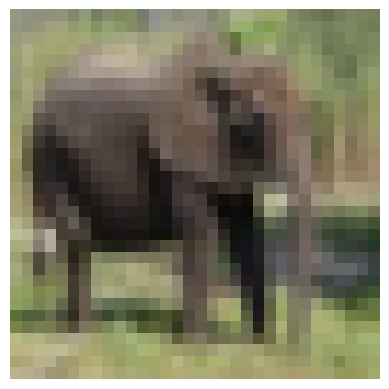

In [ ]:
# Select index for an example image from training set
img_index = 2 # 2=elephant, 3 = wolf, 17 = stegasaurus

# Get training data for that image
example = X_train_clean[img_index]

plt.imshow(example)
plt.axis("off")
plt.show()

In [ ]:
layer_outputs = [layer.output for layer in model9.layers]
layer_outputs

[<KerasTensor shape=(None, 32, 32, 32), dtype=float32, sparse=False, ragged=False, name=keras_tensor_517>,
 <KerasTensor shape=(None, 16, 16, 32), dtype=float32, sparse=False, ragged=False, name=keras_tensor_519>,
 <KerasTensor shape=(None, 16, 16, 64), dtype=float32, sparse=False, ragged=False, name=keras_tensor_522>,
 <KerasTensor shape=(None, 8, 8, 64), dtype=float32, sparse=False, ragged=False, name=keras_tensor_526>,
 <KerasTensor shape=(None, 8, 8, 128), dtype=float32, sparse=False, ragged=False, name=keras_tensor_531>,
 <KerasTensor shape=(None, 4, 4, 128), dtype=float32, sparse=False, ragged=False, name=keras_tensor_537>,
 <KerasTensor shape=(None, 4, 4, 256), dtype=float32, sparse=False, ragged=False, name=keras_tensor_544>,
 <KerasTensor shape=(None, 2, 2, 256), dtype=float32, sparse=False, ragged=False, name=keras_tensor_552>,
 <KerasTensor shape=(None, 1024), dtype=float32, sparse=False, ragged=False, name=keras_tensor_561>,
 <KerasTensor shape=(None, 128), dtype=float32, s

In [ ]:
layers_model = keras.Model(inputs=model9.inputs, outputs=layer_outputs)
outputs = layers_model.predict(example.reshape(1, 32, 32, 3))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


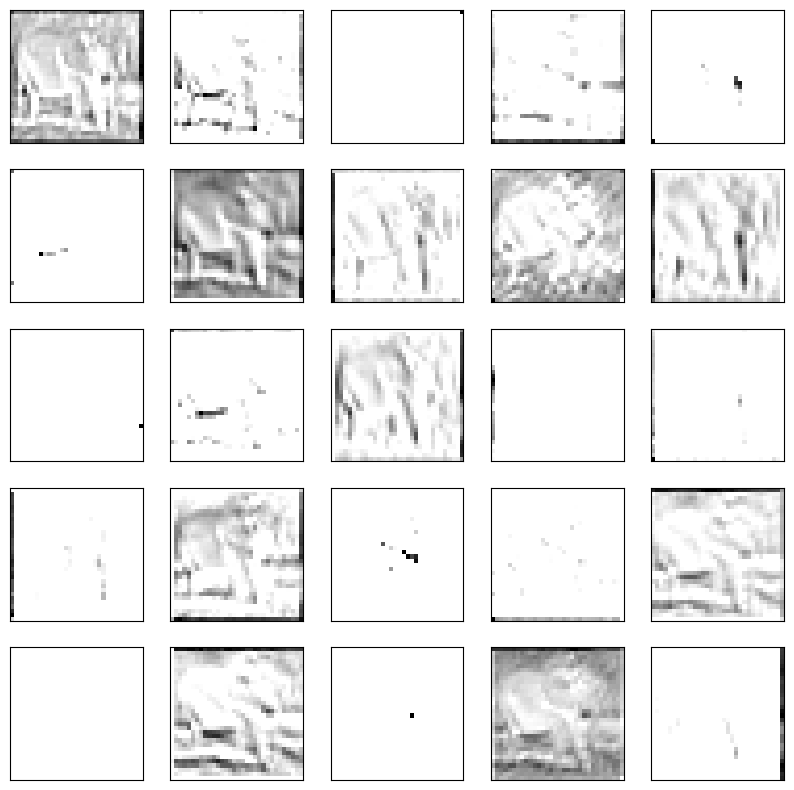

In [ ]:
layer = 0

n_col = 5
n_row = 5
plt.figure(figsize=(2*n_col, 2*n_row))
for j in range(n_row * n_col):
    plt.subplot(n_row, n_col, j + 1)
    plt.imshow(outputs[layer][0, :, :, j], plt.cm.binary)
    plt.xticks(())
    plt.yticks(())
plt.show()

#Final Test: Base Model vs Best CNN

In [ ]:
y_prob9_test = model9.predict(X_test_clean)
y_pred9_test = (y_prob9_test > 0.4).astype(int).flatten()

print(confusion_matrix(y_test_clean, y_pred9_test))
print(classification_report(y_test_clean, y_pred9_test, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
[[739 261]
 [ 95 405]]
              precision    recall  f1-score   support

           0     0.8861    0.7390    0.8059      1000
           1     0.6081    0.8100    0.6947       500

    accuracy                         0.7627      1500
   macro avg     0.7471    0.7745    0.7503      1500
weighted avg     0.7934    0.7627    0.7688      1500



The recall went up to 81, performing even better than on the validation set with a minimal loss of accuracy - which indicates that our model didn't overfit on the data.

In [ ]:
# testing the logistic regression model

#Making predictions on the validation set
y_prob_lr_test = lr.predict_proba(X_test_lr_pca)[:, 1]

y_pred_lr_test = (y_prob_lr_test > 0.4).astype(int)

#Evaluating the model on the validation set and printing the classification report consisting of accuracy, precision, recall, and f1-score
print(confusion_matrix(y_test_lr_1d, y_pred_lr_test))

print(classification_report(y_test_lr_1d, y_pred_lr_test, digits = 4))

[[753 247]
 [232 268]]
              precision    recall  f1-score   support

           0     0.7645    0.7530    0.7587      1000
           1     0.5204    0.5360    0.5281       500

    accuracy                         0.6807      1500
   macro avg     0.6424    0.6445    0.6434      1500
weighted avg     0.6831    0.6807    0.6818      1500



Vs the base model, the recall was improved by almost +30pts and the accuracy was improved by +8pts.

In [ ]:
y_prob1_test = model1.predict(X_test_clean)
y_pred1_test = (y_prob1_test > 0.4).astype(int).flatten()

print(confusion_matrix(y_test_clean, y_pred1_test))
print(classification_report(y_test_clean, y_pred1_test, digits=4))

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
[[811 189]
 [251 249]]
              precision    recall  f1-score   support

           0     0.7637    0.8110    0.7866      1000
           1     0.5685    0.4980    0.5309       500

    accuracy                         0.7067      1500
   macro avg     0.6661    0.6545    0.6588      1500
weighted avg     0.6986    0.7067    0.7014      1500

